# Predicting used car price by RandomForestRegressor
* Date: Feburary 28, 2020
* Created by Shimpei Okuda

## Table of Contents
1. Check Data
2. Cleaning Data
3. Label Encoding
4. Modeling
5. Parameter tunig
6. feature enginnering

## 0. Import modules

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling as pdp
from tqdm import tqdm_notebook as tqdm
sns.set(style="darkgrid")

from sklearn.preprocessing import LabelEncoder

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_squared_error

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold

## 1. Check Data 

In [3]:
df = pd.read_csv('../data/car_ads_3.csv', index_col=0)
df.head(5)

,maker,model,mileage,manufacture_year,engine_displacement,engine_power,body_type,color_slug,stk_year,transmission,door_count,seat_count,fuel_type,date_created,date_last_seen,price_eur
2282567,ford,fiesta,129000.0,2009.0,NaN,88.0,other,NaN,NaN,man,NaN,NaN,NaN,2016-03-01 04:22:44.466271+00,2016-07-03 17:16:27.50003+00,6900.00
845119,seat,leon,NaN,2004.0,4245.0,NaN,compact,NaN,None,NaN,None,None,gasoline,2015-12-22 06:54:54.986737+00,2016-01-07 10:08:16.993797+00,3886.01
645106,smart,fortwo,99985.0,2004.0,698.0,37.0,NaN,NaN,None,auto,2,2,gasoline,2015-12-12 17:23:52.693186+00,2016-02-10 20:13:12.406986+00,2000.22
2468530,ford,focus,212020.0,2002.0,1753.0,66.0,other,NaN,NaN,man,5,5,NaN,2016-03-04 22:05:51.891484+00,2016-07-03 17:34:54.394008+00,1600.00
3478350,volkswagen,golf,180000.0,2003.0,1900.0,74.0,other,NaN,NaN,man,NaN,NaN,NaN,2017-02-28 18:34:33.090724+00,2017-03-06 01:07:20.215485+00,1295.34


### 1-1. Pandas-profiling 

In [4]:
# import warnings
# warnings.filterwarnings('ignore')
# profile = pdp.ProfileReport(df)
# profile.to_file(output_file="./profiling.html")

In [26]:
from IPython.display import HTML
HTML(filename='profiling.html')

Number of variables,17
Number of observations,888228
Missing cells,3452445
Missing cells (%),22.9%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,579.2 MiB
Average record size in memory,683.7 B
CAT,11
NUM,6
Analysis started,2020-02-26 02:53:54.218969


### 1-2. shape, count, dtypes, info

In [27]:
print('---データ数(shape)---')
print(df.shape)
print('\n')

print('---有効データ数(count)---')
print(df.count())
print('\n')

print('---データ型(dtypes)---')
print(df.dtypes)
print('\n')

print('---データ情報(info)---')
print(df.info())

---データ数(shape)---
(888228, 16)


---有効データ数(count)---
maker                  758767
model                  604963
mileage                797759
manufacture_year       795878
engine_displacement    702433
engine_power           749571
body_type              608008
color_slug              52624
stk_year               460425
transmission           702799
door_count             734344
seat_count             700943
fuel_type              426005
date_created           888228
date_last_seen         888228
price_eur              888228
dtype: int64


---データ型(dtypes)---
maker                   object
model                   object
mileage                float64
manufacture_year       float64
engine_displacement    float64
engine_power           float64
body_type               object
color_slug              object
stk_year                object
transmission            object
door_count              object
seat_count              object
fuel_type               object
date_created            object

### 1-3. describe 

In [7]:
df.describe()

,mileage,manufacture_year,engine_displacement,engine_power,price_eur
count,7.977590e+05,795878.000000,702433.000000,749571.000000,8.882280e+05
mean,1.159063e+05,2000.808873,2042.765531,98.448538,3.062208e+06
std,3.446937e+05,82.399243,1961.148841,49.012609,2.871372e+09
min,0.000000e+00,0.000000,0.000000,1.000000,4.000000e-02
25%,1.874200e+04,2004.000000,1400.000000,68.000000,1.295340e+03
50%,8.637600e+04,2009.000000,1798.000000,86.000000,7.327910e+03
75%,1.584085e+05,2013.000000,1997.000000,110.000000,1.628179e+04
max,9.999999e+06,2017.000000,32000.000000,999.000000,2.706149e+12


### 1-4. Check missing data

In [8]:
df.isnull().sum()

maker                  129461
model                  283265
mileage                 90469
manufacture_year        92350
engine_displacement    185795
engine_power           138657
body_type              280220
color_slug             835604
stk_year               427803
transmission           185429
door_count             153884
seat_count             187285
fuel_type              462223
date_created                0
date_last_seen              0
price_eur                   0
dtype: int64

### (1-5. EDA 1)

In [ ]:
plt.rcParams["font.size"] = 26
plt.rcParams['figure.figsize'] = (18, 10)

#### Object

In [9]:
object_categories = df.select_dtypes(include=['object']).columns
print(object_categories)

Index(['maker', 'model', 'body_type', 'color_slug', 'stk_year', 'transmission',
       'door_count', 'seat_count', 'fuel_type', 'date_created',
       'date_last_seen'],
      dtype='object')


maker

maker
---unique number---
47


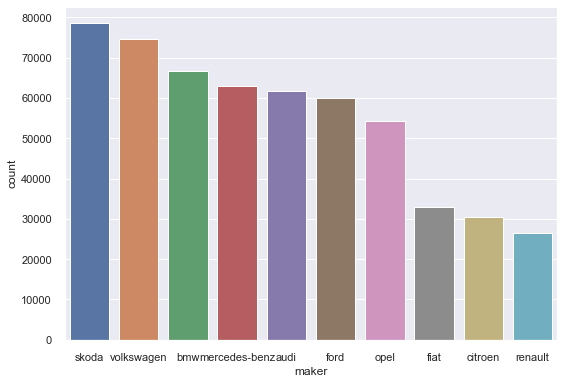

In [11]:
sns.countplot(x='maker', data=df, order=df['maker'].value_counts().iloc[:10].index)
unique = df['maker'].unique()
print('maker')
print('---unique number---')
print(str(len(unique)))
plt.tight_layout()
plt.show()

transmissinon

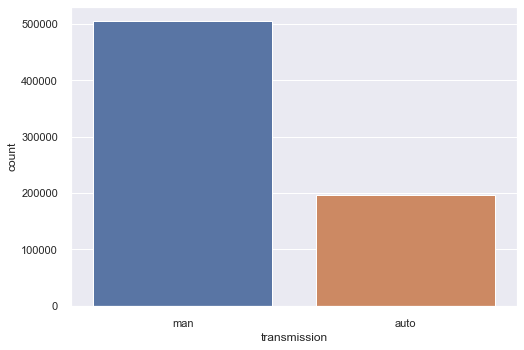

In [12]:
sns.countplot(x='transmission', data=df)
plt.show()

#### float type

In [13]:
int_categories = df.select_dtypes(include=['float64']).columns
int_categories

Index(['mileage', 'manufacture_year', 'engine_displacement', 'engine_power',
       'price_eur'],
      dtype='object')

mileage

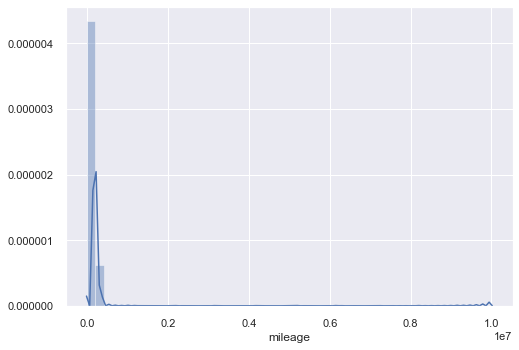

In [14]:
sns.distplot(df['mileage'].dropna())

manufacture_year

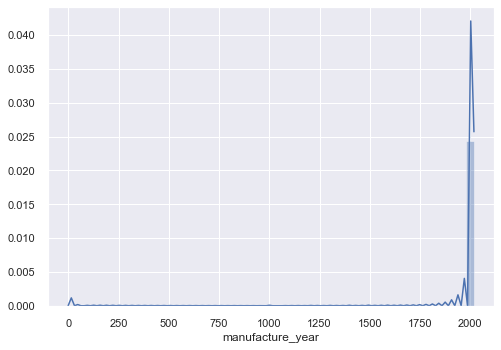

In [66]:
sns.distplot(df['manufacture_year'].dropna())

engine_displacement

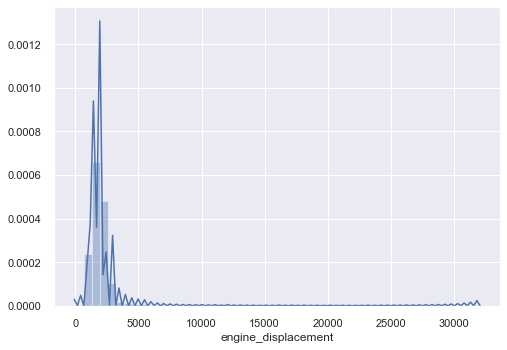

In [67]:
sns.distplot(df['engine_displacement'].dropna())

engine_power

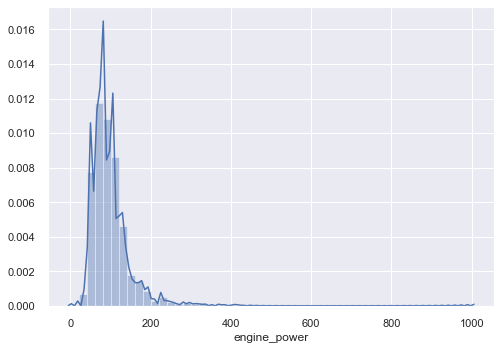

In [68]:
sns.distplot(df['engine_power'].dropna())

price_eur

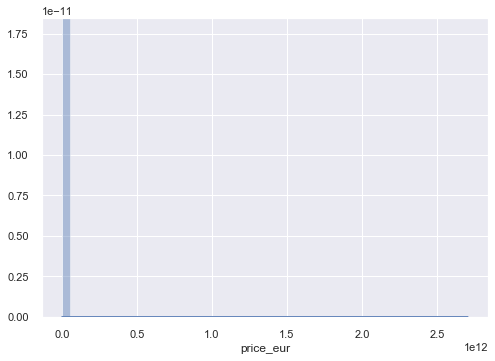

In [69]:
sns.distplot(df['price_eur'])

#### more 2 valiables

In [ ]:
sns.relplot(x="engine_displacement", y="price_eur", 
            hue="transmission", style="fuel_type",
            data=df)

## 2. Cleanig Data

### 2-1. typo, nothing data
* (body type) other -> nan
* (stk_year) None -> nan
* (door_count, seat_count) -> nan
* (manufacture_year) 0 -> nan
* (engine_displacement) 0 -> nan
* (mileage) 0 -> nan

In [5]:
df['body_type'].replace('None', np.nan, inplace=True)
df['stk_year'].replace('None', np.nan, inplace=True)
df['door_count'].replace('None', np.nan, inplace=True)
df['seat_count'].replace('None', np.nan, inplace=True)
df['manufacture_year'].replace(0, np.nan, inplace=True)
df['engine_displacement'].replace(0, np.nan, inplace=True)
df['mileage'].replace(0, np.nan, inplace=True)

In [6]:
print('---有効データ数(count)---')
print(df.count())
print('\n')

print('---欠損データ数（isnull().sum()---')
print(df.isnull().sum())
print('\n')

print('---欠損値の割合---')
print(df.isnull().sum()/df.shape[0])

---有効データ数(count)---
maker                  758767
model                  604963
mileage                757284
manufacture_year       795849
engine_displacement    702432
engine_power           749571
body_type              608008
color_slug              52624
stk_year               133993
transmission           702799
door_count             615857
seat_count             566726
fuel_type              426005
date_created           888228
date_last_seen         888228
price_eur              888228
dtype: int64


---欠損データ数（isnull().sum()---
maker                  129461
model                  283265
mileage                130944
manufacture_year        92379
engine_displacement    185796
engine_power           138657
body_type              280220
color_slug             835604
stk_year               754235
transmission           185429
door_count             272371
seat_count             321502
fuel_type              462223
date_created                0
date_last_seen              0
price_e

### 2-2. Outliers

In [8]:
def outlier_se(series):
    # 25% & 75%
    se = series
    q1 = se.describe()['25%']
    q3 = se.describe()['75%']
    iqr = q3 - q1 #四分位範囲

    # the point of outliers
    outlier_min = q1 - (iqr) * 1.5
    outlier_max = q3 + (iqr) * 1.5

    # add True label to Outliers
    se[se < outlier_min] = True
    se[se > outlier_max] = True

    return se

#### 2-2-1. price

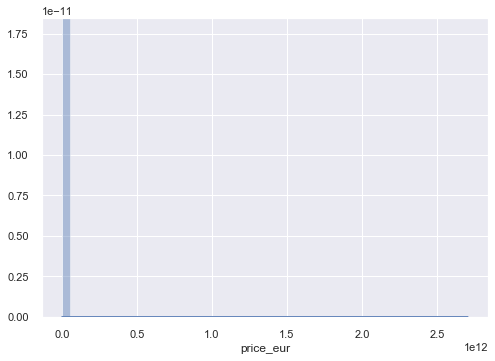

In [19]:
sns.distplot(df['price_eur'])

In [20]:
outlier_se(df['price_eur'])

/Users/okudashimpeisimac/.pyenv/versions/anaconda3-5.2.0/envs/kaggle/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
/Users/okudashimpeisimac/.pyenv/versions/anaconda3-5.2.0/envs/kaggle/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


2282567       6900
845119     3886.01
645106     2000.22
2468530       1600
3478350    1295.34
            ...   
1280030       4490
1818013    2991.12
2482226    28140.5
290990     19902.2
2146943       True
Name: price_eur, Length: 888228, dtype: object

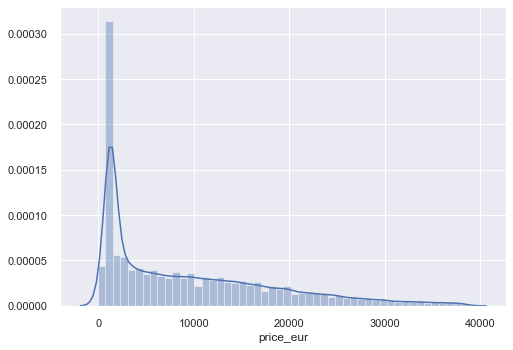

In [21]:
df = df[df['price_eur'] != True]
sns.distplot(df['price_eur'])

In [22]:
print('---有効データ数(count)---')
print(df.count())
print('\n')

print('---欠損データ数（isnull().sum()---')
print(df.isnull().sum())
print('\n')

print('---欠損値の割合---')
print(df.isnull().sum()/df.shape[0])

---有効データ数(count)---
maker                  727787
model                  588004
mileage                728536
manufacture_year       768394
engine_displacement    673645
engine_power           718008
body_type              587580
color_slug              52342
stk_year               128509
transmission           670552
door_count             586489
seat_count             542113
fuel_type              411879
date_created           854526
date_last_seen         854526
price_eur              854526
dtype: int64


---欠損データ数（isnull().sum()---
maker                  126739
model                  266522
mileage                125990
manufacture_year        86132
engine_displacement    180881
engine_power           136518
body_type              266946
color_slug             802184
stk_year               726017
transmission           183974
door_count             268037
seat_count             312413
fuel_type              442647
date_created                0
date_last_seen              0
price_e

#### 2-2-2. engine_displacement

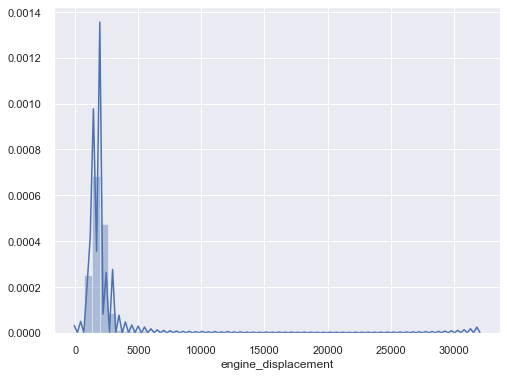

In [16]:
sns.distplot(df['engine_displacement'])

In [17]:
outlier_se(df['engine_displacement'])

/Users/okudashimpeisimac/.pyenv/versions/anaconda3-5.2.0/envs/kaggle/lib/python3.7/site-packages/ipykernel_launcher.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/okudashimpeisimac/.pyenv/versions/anaconda3-5.2.0/envs/kaggle/lib/python3.7/site-packages/pandas/core/generic.py:9114: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)
/Users/okudashimpeisimac/.pyenv/versions/anaconda3-5.2.0/envs/kaggle/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http:/

2282567     NaN
845119     True
645106      698
2468530    1753
3478350    1900
           ... 
1950514    1461
1280030     NaN
1818013    1997
2482226    True
290990     1995
Name: engine_displacement, Length: 854526, dtype: object

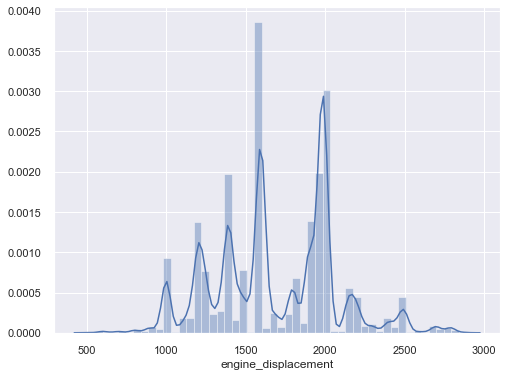

In [18]:
df = df[df['engine_displacement'] != True]
sns.distplot(df['engine_displacement'])

In [19]:
print('---有効データ数(count)---')
print(df.count())
print('\n')

print('---欠損データ数（isnull().sum()---')
print(df.isnull().sum())
print('\n')

print('---欠損値の割合---')
print(df.isnull().sum()/df.shape[0])

---有効データ数(count)---
maker                  677538
model                  558261
mileage                680753
manufacture_year       715616
engine_displacement    616826
engine_power           669531
body_type              545558
color_slug              47587
stk_year               119216
transmission           627966
door_count             550114
seat_count             506410
fuel_type              382333
date_created           797707
date_last_seen         797707
price_eur              797707
dtype: int64


---欠損データ数（isnull().sum()---
maker                  120169
model                  239446
mileage                116954
manufacture_year        82091
engine_displacement    180881
engine_power           128176
body_type              252149
color_slug             750120
stk_year               678491
transmission           169741
door_count             247593
seat_count             291297
fuel_type              415374
date_created                0
date_last_seen              0
price_e

#### 2-2-3. engine_power

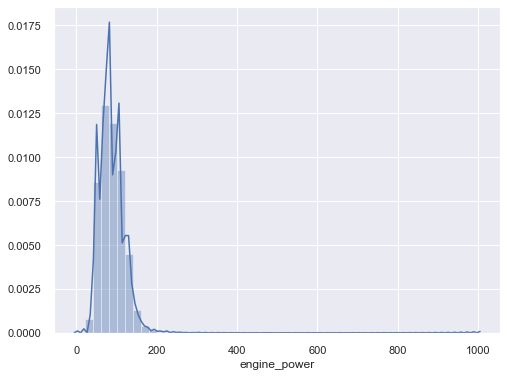

In [20]:
sns.distplot(df['engine_power'])

In [21]:
outlier_se(df['engine_power'])

2282567     88
645106      37
2468530     66
3478350     74
1808645    105
          ... 
2631653     63
1950514     55
1280030    NaN
1818013     90
290990     150
Name: engine_power, Length: 797707, dtype: object

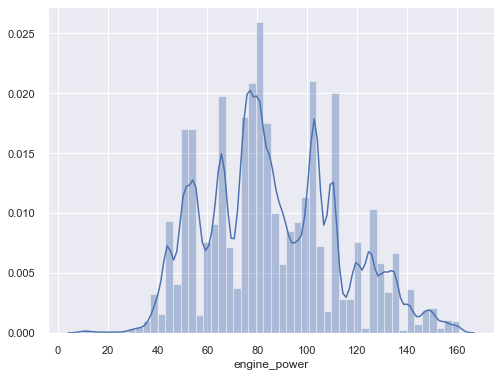

In [22]:
df = df[df['engine_power'] != True]
sns.distplot(df['engine_power'])

In [23]:
print('---有効データ数(count)---')
print(df.count())
print('\n')

print('---欠損データ数（isnull().sum()---')
print(df.isnull().sum())
print('\n')

print('---欠損値の割合---')
print(df.isnull().sum()/df.shape[0])

---有効データ数(count)---
maker                  668353
model                  551131
mileage                671586
manufacture_year       706841
engine_displacement    611449
engine_power           659030
body_type              538345
color_slug              46936
stk_year               117973
transmission           619234
door_count             542523
seat_count             500951
fuel_type              377362
date_created           787206
date_last_seen         787206
price_eur              787206
dtype: int64


---欠損データ数（isnull().sum()---
maker                  118853
model                  236075
mileage                115620
manufacture_year        80365
engine_displacement    175757
engine_power           128176
body_type              248861
color_slug             740270
stk_year               669233
transmission           167972
door_count             244683
seat_count             286255
fuel_type              409844
date_created                0
date_last_seen              0
price_e

#### 2-2-4. manufacture_year

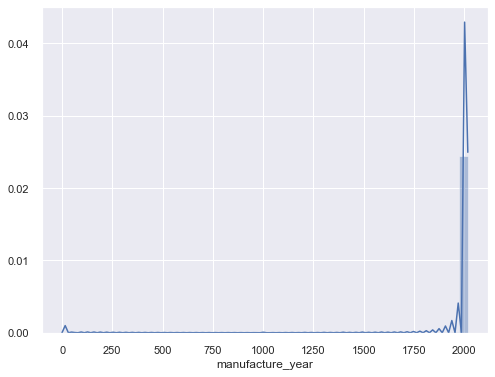

In [24]:
sns.distplot(df['manufacture_year'])

In [25]:
outlier_se(df['manufacture_year'])

2282567    2009
645106     2004
2468530    2002
3478350    2003
1808645    2002
           ... 
2631653    2012
1950514    2011
1280030    2006
1818013    1991
290990     2010
Name: manufacture_year, Length: 787206, dtype: object

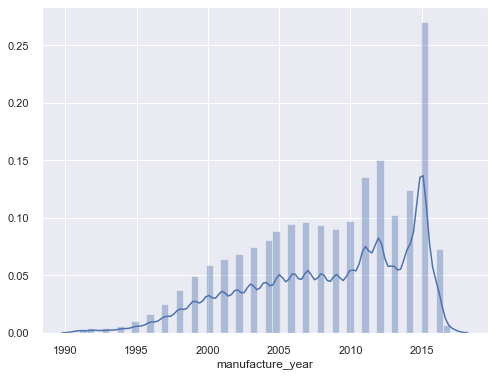

In [26]:
df = df[df['manufacture_year'] != True]
sns.distplot(df['manufacture_year'])

In [155]:
print('---有効データ数(count)---')
print(df.count())
print('\n')

print('---欠損データ数（isnull().sum()---')
print(df.isnull().sum())
print('\n')

print('---欠損値の割合---')
print(df.isnull().sum()/df.shape[0])

---有効データ数(count)---
maker                  758767
model                  604963
mileage                797759
manufacture_year       795878
engine_displacement    702433
engine_power           749571
body_type              608008
color_slug              52624
stk_year               460425
transmission           702799
door_count             734344
seat_count             700943
fuel_type              426005
date_created           888228
date_last_seen         888228
price_eur              888228
dtype: int64


---欠損データ数（isnull().sum()---
maker                  129461
model                  283265
mileage                 90469
manufacture_year        92350
engine_displacement    185795
engine_power           138657
body_type              280220
color_slug             835604
stk_year               427803
transmission           185429
door_count             153884
seat_count             187285
fuel_type              462223
date_created                0
date_last_seen              0
price_e

#### 2-2-5. mileage

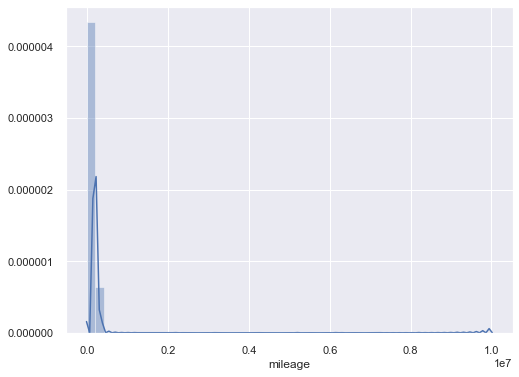

In [28]:
sns.distplot(df['mileage'])

In [29]:
outlier_se(df['mileage'])

/Users/okudashimpeisimac/.pyenv/versions/anaconda3-5.2.0/envs/kaggle/lib/python3.7/site-packages/ipykernel_launcher.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2282567    129000
645106      99985
2468530    212020
3478350    180000
1808645    188000
            ...  
2631653     13254
1950514     97000
1280030    168000
1818013    108000
290990      65000
Name: mileage, Length: 771779, dtype: object

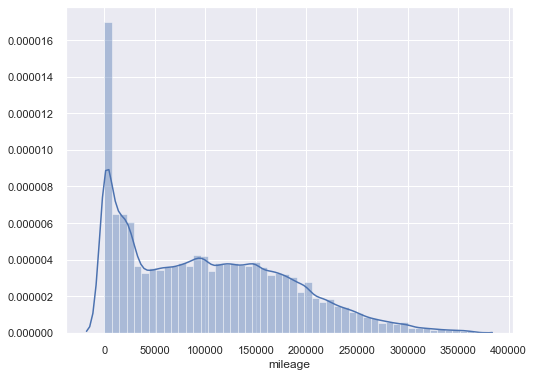

In [30]:
df = df[df['mileage'] != True]
sns.distplot(df['mileage'])

### 2-3. Select Columns

#### 情報のない列の削除
* 欠損値が20%以上
    * maker                  0.149310
    * <b>model                  0.297457</b>
    * mileage                0.147154
    * manufacture_year       0.100742
    * <b>engine_displacement    0.217935</b>
    * engine_power           0.158121
    * <b>body_type              0.320861</b>
    * <b>color_slug             0.939443</b>
    * <b>stk_year               0.849079</b>
    * transmission           0.206260
    * <b>door_count             0.300737</b>
    * <b>seat_count             0.351795</b>
    * <b>fuel_type              0.519163</b>
    * date_created           0.000000
    * date_last_seen         0.000000
    * price_eur              0.000000
* 欠損値が30%以上
    * maker                  0.149310
    * model                  0.297457
    * mileage                0.147154
    * manufacture_year       0.100742
    * engine_displacement    0.217935
    * engine_power           0.158121
    * body_type              0.320861
    * <b>color_slug             0.939443</b>
    * <b>stk_year               0.849079</b>
    * transmission           0.206260
    * <b>door_count             0.300737</b>
    * <b>seat_count             0.351795</b>
    * <b>fuel_type              0.519163</b>
    * date_created           0.000000
    * date_last_seen         0.000000
    * price_eur              0.000000
* other
date_createdとdate_last_seenは全てが別の値なので、いったん削除

In [116]:
features = list(df.columns)
bad_features20 = ['model',
                  'engine_displacement',
                  'body_type',
                  'color_slug',
                  'stk_year',
                  'door_count',
                  'seat_count',
                  'fuel_type']
bad_features30 =  ['body_type',
                  'color_slug',
                  'stk_year',
                  'door_count',
                  'seat_count',
                  'fuel_type']
bad_features = ['date_created','date_last_seen']

In [154]:
df_drop = df.drop(bad_features20, axis=1).drop(bad_features, axis=1)

(888228, 6)

### 2-4. Drop Missing Data 
1. 全てdropnna -> df_dropall
2. categoricalだけdrop,他はfillna(average) -> df_drop1 

In [34]:
df_dropall = df_drop
df_dropall = df_dropall.dropna(how='any', axis=0)
print('--欠損前--')
print(df_drop.shape)
print('--欠損後--')
print(df_dropall.shape)
print('何%残ったか')
print(df_dropall.shape[0]/df_drop.shape[0])

--欠損前--
(758876, 8)
--欠損後--
(327432, 8)
何%残ったか
0.43146969992462536


#### categoricalだけdropna

In [36]:
df_drop1 = df_drop
# maker: categorival -> dropna

# mileage: continuous -> dropna, fillna(average)
df_drop1['mileage'] = df_drop1['mileage'].fillna(np.mean(df_drop1['mileage']))

# manufacuture_year: continuous -> dropna, fillna(average)
df_drop1['manufacture_year'] = df_drop1['manufacture_year'].fillna(np.mean(df_drop1['manufacture_year']))

# engine_displacement: continuous -> dropna, fillna(average)
df_drop1['engine_displacement'] = df_drop1['engine_displacement'].fillna(np.mean(df_drop1['engine_displacement']))

# engine_power: continuous -> dropna, fillna(average)
df_drop1['engine_power'] = df_drop1['engine_power'].fillna(np.mean(df_drop1['engine_power']))

# transmission: categorival -> dropna

df_drop1 = df_drop1.dropna()
print('--欠損値処理前--')
print(df_drop.shape)
print('--欠損値処理後--')
print(df_drop1.shape)
print('何%残ったか')
print(df_drop1.shape[0]/df_drop.shape[0])


--欠損値処理前--
(758876, 8)
--欠損値処理後--
(426388, 8)
何%残ったか
0.5618678150317048


In [121]:
df_drop1.isnull().any()

maker               False
mileage             False
manufacture_year    False
engine_power        False
transmission        False
price_eur           False
dtype: bool

#### 欠損値処理後のデータフレーム->csv

In [34]:
# df_dropall.to_csv('../data/drop_all.csv', header=True)
# df_drop1.to_csv('../data/drop_ver1.csv', header=True)
# df_dropall = pd.read_csv('../data/drop_all.csv')

#### Check corrlation 

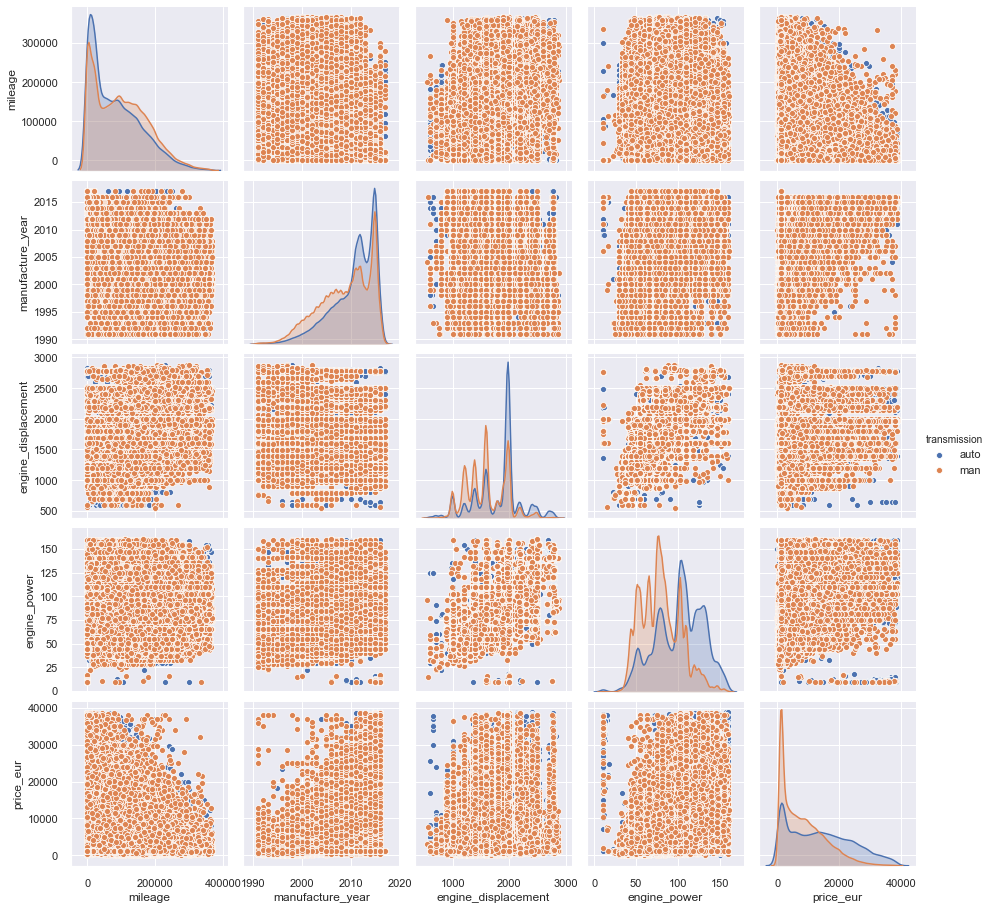

In [8]:
plt.rcParams["font.size"] = 30
plt.rcParams['figure.figsize'] = (30, 26)
sns.pairplot(df_dropall, hue='transmission')
plt.show()

#### Check each maker and price  

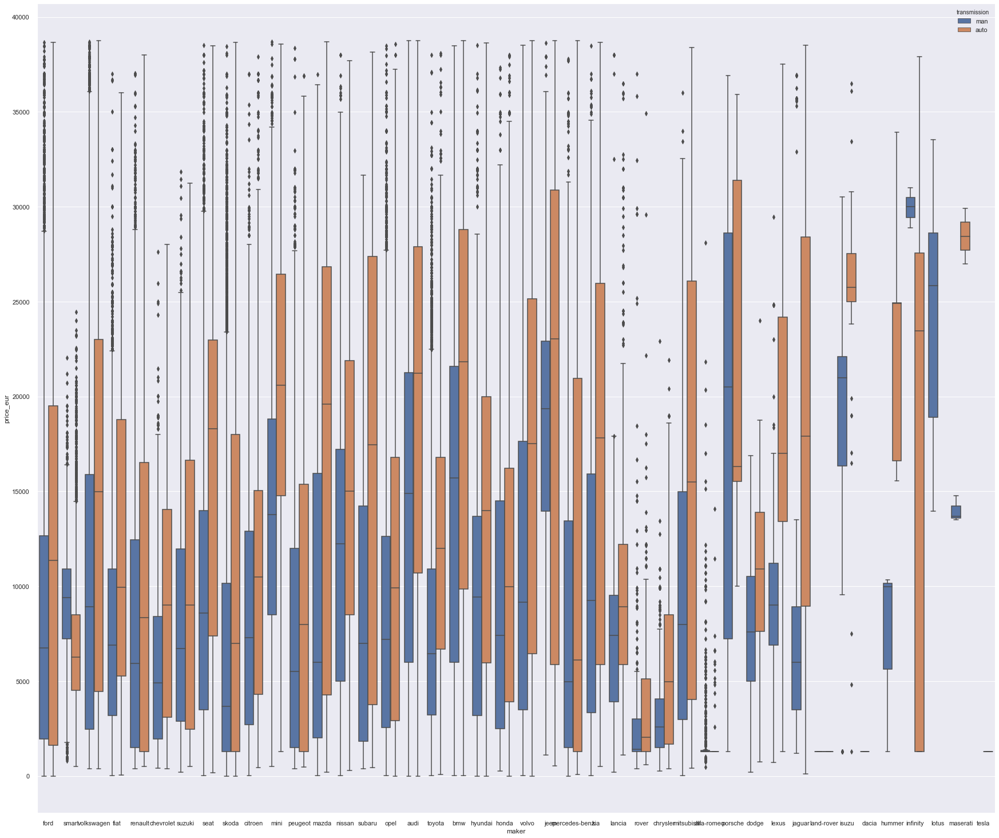

In [9]:
sns.boxplot(x='maker', y='price_eur', data=df_drop1, hue='transmission')
plt.show()

#### check engine displacement and power corrlation

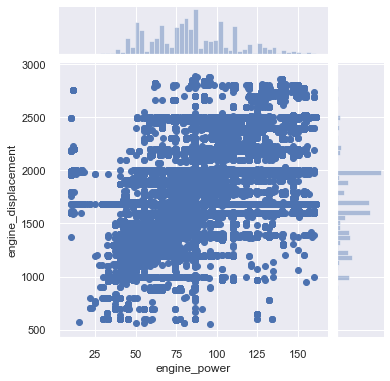

In [11]:
sns.jointplot(x="engine_power", y="engine_displacement", data=df_drop1)
plt.show()

In [122]:
df_dropall.dtypes

maker                object
mileage             float64
manufacture_year    float64
engine_power        float64
transmission         object
price_eur           float64
dtype: object

In [38]:
df_dropall = df_dropall.astype({'mileage': 'float64',
                   'manufacture_year': 'float64',
                   'engine_displacement': 'float64',
                   'engine_power': 'float64',
                   'price_eur': 'float64'})
df_drop1 = df_drop1.astype({'mileage': 'float64',
                   'manufacture_year': 'float64',
                   'engine_displacement': 'float64',
                   'engine_power': 'float64',
                   'price_eur': 'float64'})

KeyError: 'Only a column name can be used for the key in a dtype mappings argument.'

## 3. Label Encoding

* maker -> (ex, 1,2,3,4,5,...) 
* transmission (ex, 0, 1)

In [9]:
df_dropall = pd.read_csv('../data/drop_all.csv', index_col=0)
df_drop1 = pd.read_csv('../data/drop_ver1.csv', index_col=0)
df_dropall = df_dropall.drop(['model'],axis=1)
df_dropall

,maker,mileage,manufacture_year,engine_displacement,engine_power,transmission,price_eur
645106,smart,99985.0,2004.0,698.0,37.0,auto,2000.22
2468530,ford,212020.0,2002.0,1753.0,66.0,man,1600.00
3478350,volkswagen,180000.0,2003.0,1900.0,74.0,man,1295.34
1135859,fiat,85613.0,2007.0,1248.0,55.0,man,3800.00
2167119,renault,116000.0,2011.0,1461.0,81.0,auto,8950.00
...,...,...,...,...,...,...,...
1532272,fiat,111000.0,2009.0,1900.0,77.0,man,8500.00
2645571,toyota,238000.0,2001.0,1998.0,110.0,man,3663.95
2631653,skoda,13254.0,2012.0,1197.0,63.0,man,11450.00
1950514,renault,97000.0,2011.0,1461.0,55.0,man,7500.00


In [157]:
makers = df_dropall.maker.unique()
transmissions = df_dropall.transmission.unique()

In [158]:
le = LabelEncoder()
le.fit(makers)

LabelEncoder()

In [159]:
list(le.classes_)

['alfa-romeo',
 'audi',
 'bmw',
 'chevrolet',
 'chrysler',
 'citroen',
 'dacia',
 'dodge',
 'fiat',
 'ford',
 'honda',
 'hyundai',
 'infinity',
 'isuzu',
 'jaguar',
 'jeep',
 'kia',
 'lancia',
 'land-rover',
 'lexus',
 'lotus',
 'mazda',
 'mercedes-benz',
 'mini',
 'mitsubishi',
 'nissan',
 'opel',
 'peugeot',
 'porsche',
 'renault',
 'rover',
 'seat',
 'skoda',
 'smart',
 'subaru',
 'suzuki',
 'toyota',
 'volkswagen',
 'volvo']

In [160]:
df_dropall['maker_label'] = le.transform(df_dropall['maker'])

In [161]:
le = LabelEncoder()
le.fit(transmissions)

LabelEncoder()

In [162]:
list(le.classes_)

['auto', 'man']

In [163]:
df_dropall['transmission_label'] = le.transform(df_dropall['transmission'])

In [164]:
df_final = df_dropall.drop(['maker', 'transmission'], axis=1)

In [165]:
df_final

,mileage,manufacture_year,engine_displacement,engine_power,price_eur,maker_label,transmission_label
645106,99985.0,2004.0,698.0,37.0,2000.22,33,0
2468530,212020.0,2002.0,1753.0,66.0,1600.00,9,1
3478350,180000.0,2003.0,1900.0,74.0,1295.34,37,1
1135859,85613.0,2007.0,1248.0,55.0,3800.00,8,1
2167119,116000.0,2011.0,1461.0,81.0,8950.00,29,0
...,...,...,...,...,...,...,...
1532272,111000.0,2009.0,1900.0,77.0,8500.00,8,1
2645571,238000.0,2001.0,1998.0,110.0,3663.95,36,1
2631653,13254.0,2012.0,1197.0,63.0,11450.00,32,1
1950514,97000.0,2011.0,1461.0,55.0,7500.00,29,1


## 4. Modeling

### 4-1. Data split

In [166]:
X = df_final.drop(['price_eur'], axis=1)
y = df_final['price_eur']

In [167]:
print(X.shape)
print(y.shape)

(327432, 6)
(327432,)


In [168]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

In [169]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(261945, 6)
(65487, 6)
(261945,)
(65487,)


In [170]:
X_train_new, X_val, y_train_new, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

### Predicting by Randomforest

In [47]:
param_grid = { "criterion" : ["mse"]
              , "min_samples_leaf" : [3]
              , "min_samples_split" : [3]
              , "max_depth": [10]
              , "n_estimators": [500]}

In [49]:
gs = GridSearchCV(estimator=rf, param_grid=param_grid, cv=2, n_jobs=-1, verbose=1)
gs = gs.fit(X_train_new, y_train_new)

Fitting 2 folds for each of 720 candidates, totalling 1440 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed: 43.7min


KeyboardInterrupt: 

In [73]:
print(gs.best_score_)
print(gs.best_params_)

0.7751932880563268
{'criterion': 'mse', 'max_depth': 10, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 500}


In [74]:
bp = gs.best_params_
forest = RandomForestRegressor(criterion=bp['criterion'],
                              min_samples_leaf=bp['min_samples_leaf'],
                              min_samples_split=bp['min_samples_split'],
                              max_depth=bp['max_depth'],
                              n_estimators=bp['n_estimators'])
forest.fit(X_train, y_train)
# Explained variance score: 1 is perfect prediction
print('Score: %.2f' % forest.score(X_val, y_val))

Score: 0.77


Feature ranking:
1. feature 1 (0.586335)
2. feature 3 (0.175607)
3. feature 0 (0.118108)
4. feature 4 (0.062676)
5. feature 2 (0.053052)
6. feature 5 (0.004221)
['mileage' 'manufacture_year' 'engine_displacement' 'engine_power'
 'maker_label' 'transmission_label']


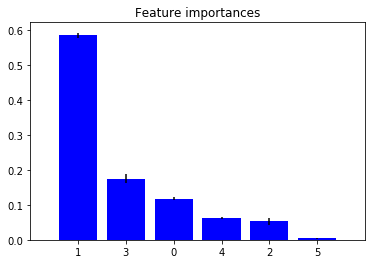

In [83]:
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]
# Print the feature ranking
print("Feature ranking:")

for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

print(X_train.columns.values)
# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="b", yerr=std[indices], align="center",tick_label = X_train.columns.values)
plt.xticks(range(X.shape[1]), indices)
plt.xlim([-1, X.shape[1]])
plt.show()

## 5. Parameter tuning
use grid search

In [171]:
param_grid = { "criterion" : ["mse"]
              , "min_samples_leaf" : [3]
              , "min_samples_split" : [3]
              , "max_depth": [5, 10]
              , "n_estimators": [100, 500, 1000]}

In [173]:
gs = GridSearchCV(estimator=rf, param_grid=param_grid, cv=2, n_jobs=-1, verbose=1)
gs = gs.fit(X_train, y_train)
print(gs.best_score_)
print(gs.best_params_)

Fitting 2 folds for each of 6 candidates, totalling 12 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 out of  12 | elapsed:  2.0min remaining:   23.4s
[Parallel(n_jobs=-1)]: Done  12 out of  12 | elapsed:  2.9min finished


0.7760182787270251
{'criterion': 'mse', 'max_depth': 10, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 1000}


In [175]:
bp = gs.best_params_
forest = RandomForestRegressor(criterion=bp['criterion'],
                              min_samples_leaf=bp['min_samples_leaf'],
                              min_samples_split=bp['min_samples_split'],
                              max_depth=bp['max_depth'],
                              n_estimators=bp['n_estimators'])
forest.fit(X_train, y_train)
# Explained variance score: 1 is perfect prediction
print('Score: %.2f' % forest.score(X_test, y_test))

Score: 0.78


Feature ranking:
1. feature 1 (0.590878)
2. feature 3 (0.171017)
3. feature 0 (0.116543)
4. feature 4 (0.062123)
5. feature 2 (0.056226)
6. feature 5 (0.003213)
['mileage' 'manufacture_year' 'engine_displacement' 'engine_power'
 'maker_label' 'transmission_label']


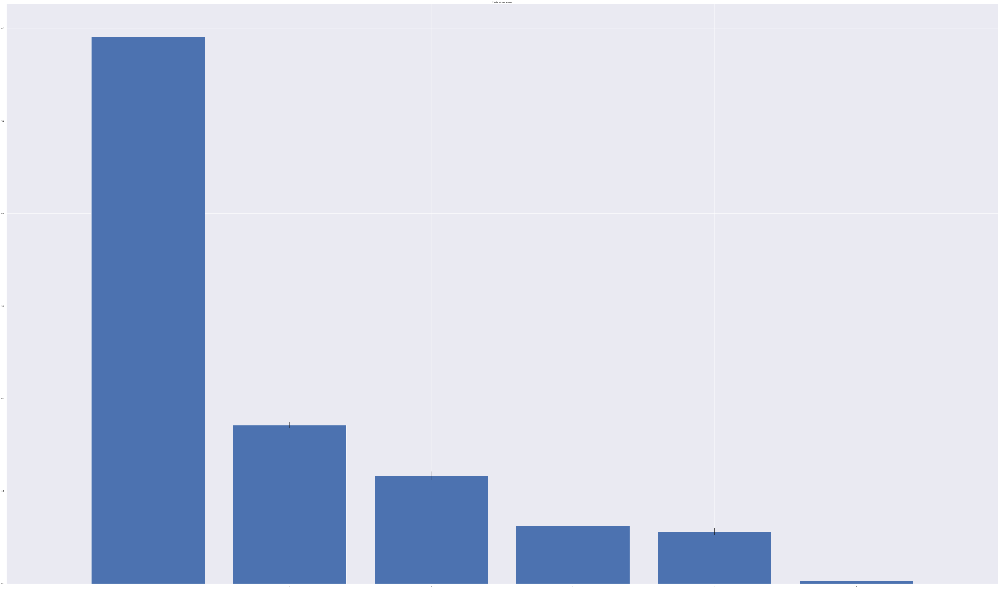

In [182]:
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]
# Print the feature ranking
print("Feature ranking:")

for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

print(X_train.columns.values)
# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
       color="b", yerr=std[indices], align="center",tick_label = X_train.columns.values)
plt.xticks(range(X.shape[1]), indices)
plt.xlim([-1, X.shape[1]])
plt.show()

## 6. feature enginnering

In [176]:
print(df_dropall['maker'].unique())
print(len(df_dropall['maker'].unique()))

['smart' 'ford' 'volkswagen' 'fiat' 'renault' 'chevrolet' 'suzuki' 'seat'
 'mini' 'peugeot' 'mazda' 'skoda' 'citroen' 'subaru' 'audi' 'bmw'
 'hyundai' 'toyota' 'nissan' 'honda' 'opel' 'volvo' 'jeep' 'mercedes-benz'
 'kia' 'chrysler' 'mitsubishi' 'dodge' 'lancia' 'alfa-romeo' 'lexus'
 'rover' 'land-rover' 'jaguar' 'dacia' 'isuzu' 'infinity' 'lotus'
 'porsche']
39


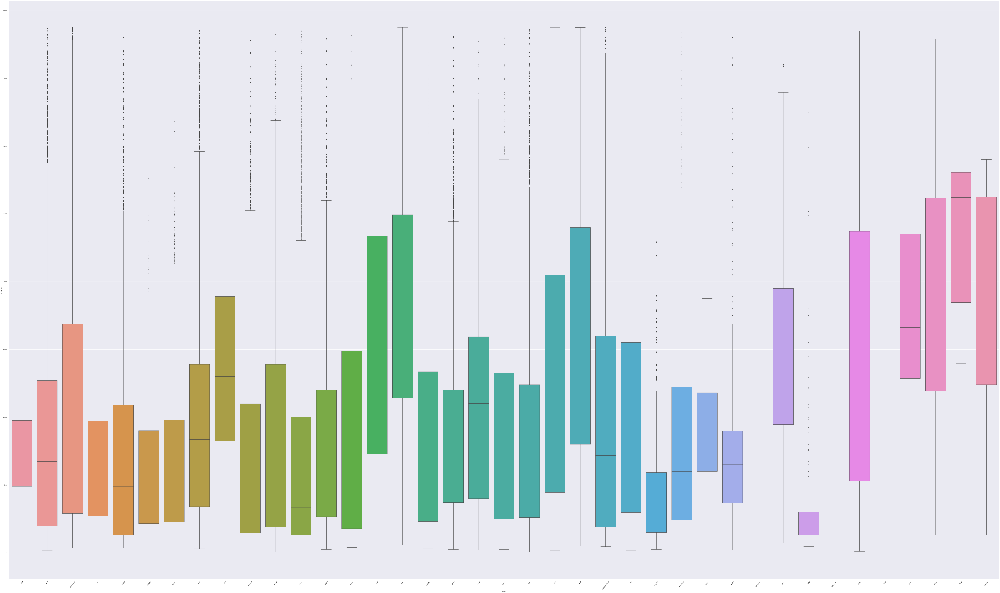

In [177]:
plt.rcParams["font.size"] = 60
plt.rcParams['figure.figsize'] = (100, 60)
sns.boxplot(x='maker', y='price_eur', data=df_dropall)
plt.xticks(rotation=50)
plt.tight_layout()

In [10]:
makergroup = df_dropall.groupby(by='maker')
makergroup = makergroup.mean().sort_values('price_eur')
makergroup = pd.DataFrame(makergroup)
makergroup.head(20)

,mileage,manufacture_year,engine_displacement,engine_power,price_eur
maker,,,,,
dacia,75621.938272,2011.981481,1438.197531,67.407407,1295.340000
land-rover,169942.645161,2006.467742,2358.032258,113.596774,1295.340000
alfa-romeo,161750.810160,2005.371658,1901.721925,103.695187,2097.941551
rover,160668.648352,2002.391941,1957.523810,92.637363,3156.401832
chrysler,161745.503589,2003.832536,2370.382775,105.281100,4326.603050
chevrolet,86120.849676,2009.165967,1505.677986,78.530332,6256.557730
skoda,110065.947025,2009.566378,1576.467039,77.895488,6357.070826
lancia,91881.363636,2008.320953,1423.272173,67.360310,6777.171214
renault,106423.049002,2008.208407,1525.545848,74.785285,6802.430583


In [180]:
label = list(range(1000, 25000, 1000))
makergroup['maker_label'] = pd.cut(makergroup['price_eur'], bins=24, labels=label)

In [183]:
maker_dic = makergroup['maker_label'].to_dict()
makerlist = df_dropall['maker'].to_list()
makerlabel = []
for maker in makerlist:
    makerlabel.append(maker_dic[maker])

In [185]:
df_final['maker_label'] = makerlabel
df_final.head()

,mileage,manufacture_year,engine_displacement,engine_power,price_eur,maker_label,transmission_label
645106,99985.0,2004.0,698.0,37.0,2000.22,7000,0
2468530,212020.0,2002.0,1753.0,66.0,1600.00,8000,1
3478350,180000.0,2003.0,1900.0,74.0,1295.34,11000,1
1135859,85613.0,2007.0,1248.0,55.0,3800.00,7000,1
2167119,116000.0,2011.0,1461.0,81.0,8950.00,6000,0


In [187]:
X = df_final.drop(['price_eur'], axis=1)
y = df_final['price_eur']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

In [188]:
bp = gs.best_params_
forest = RandomForestRegressor(criterion=bp['criterion'],
                              min_samples_leaf=bp['min_samples_leaf'],
                              min_samples_split=bp['min_samples_split'],
                              max_depth=bp['max_depth'],
                              n_estimators=bp['n_estimators'])
forest.fit(X_train, y_train)
# Explained variance score: 1 is perfect prediction
print('Score: %.2f' % forest.score(X_test, y_test))

Score: 0.79


In [196]:
importances = forest.feature_importances_
for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))
print(X_train.columns.values)

1. feature 1 (0.590744)
2. feature 3 (0.162290)
3. feature 0 (0.107278)
4. feature 4 (0.094276)
5. feature 2 (0.042650)
6. feature 5 (0.002762)
['mileage' 'manufacture_year' 'engine_displacement' 'engine_power'
 'maker_label' 'transmission_label']


In [202]:
param_grid = { "criterion" : ["mse"]
              , "min_samples_leaf" : [3]
              , "min_samples_split" : [3]
              , "max_depth": [10, 15, 20]
              , "n_estimators": [1000]}
gs = GridSearchCV(estimator=rf, param_grid=param_grid, cv=2, n_jobs=-1, verbose=1)
gs = gs.fit(X_train, y_train)
print(gs.best_score_)
print(gs.best_params_)

Fitting 2 folds for each of 3 candidates, totalling 6 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of   6 | elapsed:  4.9min finished


0.8074966832768932
{'criterion': 'mse', 'max_depth': 20, 'min_samples_leaf': 3, 'min_samples_split': 3, 'n_estimators': 1000}


In [219]:
bp = gs.best_params_
forest = RandomForestRegressor(criterion=bp['criterion'],
                              min_samples_leaf=bp['min_samples_leaf'],
                              min_samples_split=bp['min_samples_split'],
                              max_depth=bp['max_depth'],
                              n_estimators=bp['n_estimators'])
forest.fit(X_train, y_train)
# Explained variance score: 1 is perfect prediction
print('Score: %.2f' % forest.score(X_test, y_test))

Score: 0.82


In [203]:
def plot_feature_importance (model, n_features, feature_names): 
    plt.barh(range(n_features), 
             model.feature_importances_,
             align='center')
    plt.yticks(np.arange(n_features), feature_names)
    plt.xlabel("Feature Importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)

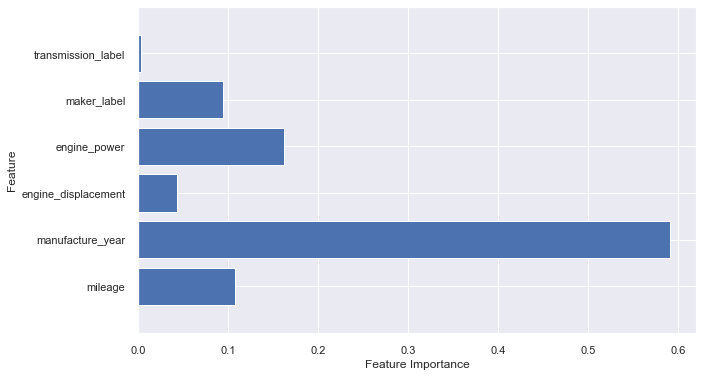

In [218]:
n_features = X.shape[1]
feature_names = X_train.columns
plot_feature_importance(forest, n_features, feature_names)
plt.rcParams["font.size"] = 40
plt.rcParams['figure.figsize'] = (8, 6)
plt.show()